In [1]:
import os
import time
import json
import requests
from zipfile import ZipFile
import tarfile
from shutil import copyfile
from dataclasses import dataclass, field

import yaml
import glob

import random
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt

In [2]:
!pip install -q tensorboard ultralytics

In [3]:

import cv2

from ultralytics import YOLO

In [4]:
# Download and dataset.
def download_and_unzip(url, save_path):

    print("Downloading and extracting assets...", end="")
    file = requests.get(url)
    open(save_path, "wb").write(file.content)

    try:
        # Extract tarfile.
        if save_path.endswith(".tar"):
            with tarfile.open(save_path, "r") as tar:
                tar.extractall(os.path.split(save_path)[0])

        print("Done")
    except:
        print("Invalid file")

In [5]:
IMAGES_URL = r"http://vision.stanford.edu/aditya86/ImageNetDogs/images.tar"
IMAGES_DIR = "Images"
IMAGES_TAR_PATH = os.path.join(os.getcwd(), f"{IMAGES_DIR}.tar")

ANNS_METADATA_URL = r"https://github.com/benjiebob/StanfordExtra/raw/master/keypoint_definitions.csv"
ANNS_METADATA = "keypoint_definitions.csv"

# Download if dataset does not exists.
if not os.path.exists(IMAGES_DIR):
    download_and_unzip(IMAGES_URL, IMAGES_TAR_PATH)
    os.remove(IMAGES_TAR_PATH)

if not os.path.isfile(ANNS_METADATA):
    download_and_unzip(ANNS_METADATA_URL, ANNS_METADATA)

In [7]:
JSON_PATH =  "../input/stanfordextra/StanfordExtra_v12.json"

with open(JSON_PATH) as file:
    json_data = json.load(file)

In [8]:
train_ids = np.load( "../input/stanfordextra/train_stanford_StanfordExtra_v12.npy")
val_ids = np.load("../input/stanfordextra/val_stanford_StanfordExtra_v12.npy")

print(f"Train Samples: {len(train_ids)}")
print(f"Validation Samples: {len(val_ids)}")

Train Samples: 6773
Validation Samples: 4062


In [9]:
DATA_DIR = "animal-pose-data"

TRAIN_DIR         = f"train"
TRAIN_FOLDER_IMG    = f"images"
TRAIN_FOLDER_LABELS = f"labels"

TRAIN_IMG_PATH   = os.path.join(DATA_DIR, TRAIN_DIR, TRAIN_FOLDER_IMG)
TRAIN_LABEL_PATH = os.path.join(DATA_DIR, TRAIN_DIR, TRAIN_FOLDER_LABELS)

VALID_DIR           = f"valid"
VALID_FOLDER_IMG    = f"images"
VALID_FOLDER_LABELS = f"labels"

VALID_IMG_PATH   = os.path.join(DATA_DIR, VALID_DIR, VALID_FOLDER_IMG)
VALID_LABEL_PATH = os.path.join(DATA_DIR, VALID_DIR, VALID_FOLDER_LABELS)

os.makedirs(TRAIN_IMG_PATH, exist_ok=True)
os.makedirs(TRAIN_LABEL_PATH, exist_ok=True)
os.makedirs(VALID_IMG_PATH, exist_ok=True)
os.makedirs(VALID_LABEL_PATH, exist_ok=True)

In [10]:
train_json_data = []
for train_id in train_ids:
    train_json_data.append(json_data[train_id])

val_json_data = []
for val_id in val_ids:
    val_json_data.append(json_data[val_id])

In [11]:
for data in train_json_data:
    img_file = data["img_path"]
    filename = img_file.split("/")[-1]
    copyfile(os.path.join(IMAGES_DIR, img_file),
             os.path.join(TRAIN_IMG_PATH, filename))


for data in val_json_data:
    img_file = data["img_path"]
    filename = img_file.split("/")[-1]
    copyfile(os.path.join(IMAGES_DIR, img_file),
             os.path.join(VALID_IMG_PATH, filename))

In [12]:
CLASS_ID = 0

In [16]:
def create_yolo_boxes_kpts(img_size, boxes, lm_kpts):

    IMG_W, IMG_H = img_size
    # Modify kpts with visibilities as 1s to 2s.
    vis_ones = np.where(lm_kpts[:, -1] == 1.)
    lm_kpts[vis_ones, -1] = 2.

    # Normalizing factor for bboxes and kpts.
    res_box_array = np.array([IMG_W, IMG_H, IMG_W, IMG_H])
    res_lm_array = np.array([IMG_W, IMG_H])

    # Normalize landmarks in the range [0,1].
    norm_kps_per_img = lm_kpts.copy()
    norm_kps_per_img[:, :-1]  = norm_kps_per_img[:, :-1] / res_lm_array

    # Normalize bboxes in the range [0,1].
    norm_bbox_per_img = boxes / res_box_array

    # Create bboxes coordinates to YOLO.
    # x_c, y_c = x_min + bbox_w/2. , y_min + bbox_h/2.
    yolo_boxes = norm_bbox_per_img.copy()
    yolo_boxes[:2] = norm_bbox_per_img[:2] + norm_bbox_per_img[2:]/2.

    return yolo_boxes, norm_kps_per_img

In [17]:
def create_yolo_txt_files(json_data, LABEL_PATH):

    for data in json_data:

        IMAGE_ID = data["img_path"].split("/")[-1].split(".")[0]

        IMG_WIDTH, IMG_HEIGHT = data["img_width"], data["img_height"]

        landmark_kpts  = np.nan_to_num(np.array(data["joints"], dtype=np.float32))
        landmarks_bboxes = np.array(data["img_bbox"], dtype=np.float32)

        bboxes_yolo, kpts_yolo = create_yolo_boxes_kpts(
                                            (IMG_WIDTH, IMG_HEIGHT),
                                            landmarks_bboxes,
                                            landmark_kpts)

        TXT_FILE = IMAGE_ID+".txt"

        with open(os.path.join(LABEL_PATH, TXT_FILE), "w") as f:

            x_c_norm, y_c_norm, box_width_norm, box_height_norm = round(bboxes_yolo[0],5),\
                                                                  round(bboxes_yolo[1],5),\
                                                                  round(bboxes_yolo[2],5),\
                                                                  round(bboxes_yolo[3],5),\

            kps_flattend = [round(ele,5) for ele in kpts_yolo.flatten().tolist()]
            line = f"{CLASS_ID} {x_c_norm} {y_c_norm} {box_width_norm} {box_height_norm} "
            line+= " ".join(map(str, kps_flattend))
            f.write(line)

In [18]:
create_yolo_txt_files(train_json_data, TRAIN_LABEL_PATH)
create_yolo_txt_files(val_json_data, VALID_LABEL_PATH)

In [19]:
ann_meta_data = pd.read_csv("keypoint_definitions.csv")
COLORS = ann_meta_data["Hex colour"].values.tolist()

COLORS_RGB_MAP = []
for color in COLORS:
    R, G, B = int(color[:2], 16), int(color[2:4], 16), int(color[4:], 16)
    COLORS_RGB_MAP.append({color: (R,G,B)})

In [20]:
train_images = os.listdir(TRAIN_IMG_PATH)
valid_images = os.listdir(VALID_IMG_PATH)

print(f"Training images: {len(train_images)}, Validation Images: {len(valid_images)}")

Training images: 6773, Validation Images: 4062


In [21]:
def draw_landmarks(image, landmarks):

    radius = 5
    # Check if image width is greater than 1000 px.
    # To improve visualization.
    if (image.shape[1] > 1000):
        radius = 8

    for idx, kpt_data in enumerate(landmarks):

        loc_x, loc_y = kpt_data[:2].astype("int").tolist()
        color_id = list(COLORS_RGB_MAP[int(kpt_data[-1])].values())[0]

        cv2.circle(image,
                   (loc_x, loc_y),
                   radius,
                   color=color_id[::-1],
                   thickness=-1,
                   lineType=cv2.LINE_AA)

    return image

In [22]:
def draw_boxes(image, detections, class_name = "dog", score=None, color=(0,255,0)):

    font_size = 0.25 + 0.07 * min(image.shape[:2]) / 100
    font_size = max(font_size, 0.5)
    font_size = min(font_size, 0.8)
    text_offset = 3

    thickness = 2
    # Check if image width is greater than 1000 px.
    # To improve visualization.
    if (image.shape[1] > 1000):
        thickness = 10

    xmin, ymin, xmax, ymax = detections[:4].astype("int").tolist()
    conf = round(float(detections[-1]),2)
    cv2.rectangle(image,
                  (xmin, ymin),
                  (xmax, ymax),
                  color=(0,255,0),
                  thickness=thickness,
                  lineType=cv2.LINE_AA)

    display_text = f"{class_name}"

    if score is not None:
        display_text+=f": {score:.2f}"

    (text_width, text_height), _ = cv2.getTextSize(display_text,
                                                   cv2.FONT_HERSHEY_SIMPLEX,
                                                   font_size, 2)

    cv2.rectangle(image,
                      (xmin, ymin),
                      (xmin + text_width + text_offset, ymin - text_height - int(15 * font_size)),
                      color=color, thickness=-1)

    image = cv2.putText(
                    image,
                    display_text,
                    (xmin + text_offset, ymin - int(10 * font_size)),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    font_size,
                    (0, 0, 0),
                    2, lineType=cv2.LINE_AA,
                )

    return image


In [23]:
def visualize_annotations(image, box_data, keypoints_data):

    image = image.copy()
    
    shape_multiplier = np.array(image.shape[:2][::-1]) # (W, H).
    # Final absolute coordinates (xmin, ymin, xmax, ymax).
    denorm_boxes = np.zeros_like(box_data)

    # De-normalize center coordinates from YOLO to (xmin, ymin).
    denorm_boxes[:, :2] = (shape_multiplier/2.) * (2*box_data[:,:2] - box_data[:,2:])

    # De-normalize width and height from YOLO to (xmax, ymax).
    denorm_boxes[:, 2:] = denorm_boxes[:,:2] + box_data[:,2:]*shape_multiplier

    for boxes, kpts in zip(denorm_boxes, keypoints_data):
        # De-normalize landmark coordinates.
        kpts[:, :2]*= shape_multiplier
        image = draw_boxes(image, boxes)
        image = draw_landmarks(image, kpts)

    return image

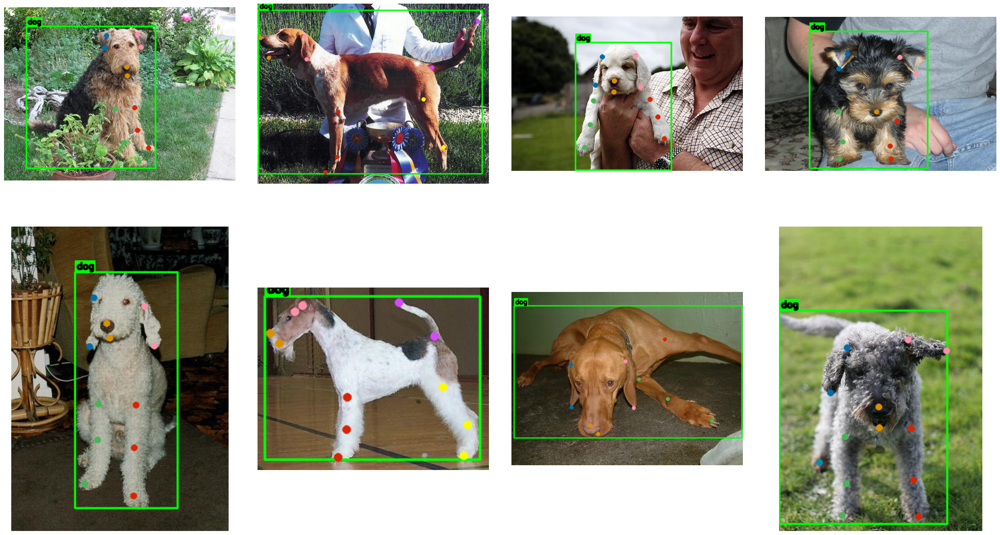

In [24]:
IMAGE_FILES = os.listdir(TRAIN_IMG_PATH)
NUM_LANDMARKS = 24

num_samples = 8
num_rows = 2
num_cols = num_samples//num_rows

fig, ax = plt.subplots(
        nrows=num_rows,
        ncols=num_cols,
        figsize=(25, 15),
    )

random.seed(45)
random.shuffle(IMAGE_FILES)

for idx, (file, axis) in enumerate(zip(IMAGE_FILES[:num_samples], ax.flat)):

    image = cv2.imread(os.path.join(TRAIN_IMG_PATH, file))

    # Obtain the txt file for the corresponding image file.
    filename = file.split(".")[0]
    # Split each object instance in separate lists.
    with open(os.path.join(TRAIN_LABEL_PATH, filename+".txt"), "r") as file:
        label_data = [x.split() for x in file.read().strip().splitlines() if len(x)]

    label_data = np.array(label_data, dtype=np.float32)

    # YOLO BBox instances in [x-center, y-center, width, height] in normalized form.
    box_instances = label_data[:,1:5]
    # Shape: (N, 4), where, N = #instances per-image

    # Kpt instances.
    # Filter keypoints based on visibility.
    instance_kpts = []
    kpts_data = label_data[:,5:].reshape(-1, NUM_LANDMARKS, 3)

    for inst_kpt in kpts_data:
        vis_ids = np.where(inst_kpt[:, -1]>0.)[0]
        vis_kpts = inst_kpt[vis_ids][:,:2]
        vis_kpts = np.concatenate([vis_kpts, np.expand_dims(vis_ids, axis=-1)], axis=-1)
        instance_kpts.append(vis_kpts)

    image_ann = visualize_annotations(image, box_instances, instance_kpts)
    axis.imshow(image_ann[...,::-1])
    axis.axis("off")


plt.tight_layout(h_pad=4., w_pad=4.)
plt.show();

In [25]:
@dataclass(frozen=True)
class TrainingConfig:
    DATASET_YAML:   str = "animal-keypoints.yaml"
    MODEL:          str = "../input/weights/best.pt"
    EPOCHS:         int = 100
    KPT_SHAPE:    tuple = (24,3)
    PROJECT:        str = "Animal_Keypoints"
    NAME:           str = f"{MODEL.split('.')[0]}_{EPOCHS}_epochs"
    CLASSES_DICT:  dict = field(default_factory = lambda:{0 : "dog"})
      

In [26]:
@dataclass(frozen=True)
class DatasetConfig:
    IMAGE_SIZE:    int   = 640
    BATCH_SIZE:    int   = 16
    CLOSE_MOSAIC:  int   = 10
    MOSAIC:        float = 0.4
    FLIP_LR:       float = 0.0 # Turn off horizontal flip.

In [27]:
train_config = TrainingConfig()
data_config = DatasetConfig()

In [28]:
current_dir = os.getcwd()

data_dict = dict(
                path      = os.path.join(current_dir, DATA_DIR),
                train     = os.path.join(TRAIN_DIR, TRAIN_FOLDER_IMG),
                val       = os.path.join(VALID_DIR, VALID_FOLDER_IMG),
                names     = train_config.CLASSES_DICT,
                kpt_shape = list(train_config.KPT_SHAPE),
               )

with open(train_config.DATASET_YAML, "w") as config_file:
    yaml.dump(data_dict, config_file)

In [29]:
pose_model = model = YOLO(train_config.MODEL)

pose_model.train(data    = train_config.DATASET_YAML,
            epochs       = train_config.EPOCHS,
            imgsz        = data_config.IMAGE_SIZE,
            batch        = data_config.BATCH_SIZE,
            project      = train_config.PROJECT,
            name         = train_config.NAME,
            close_mosaic = data_config.CLOSE_MOSAIC,
            mosaic       = data_config.MOSAIC,
            fliplr       = data_config.FLIP_LR
            
           )

Ultralytics YOLOv8.0.230 🚀 Python-3.10.12 torch-2.0.0 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)
engine/trainer: task=pose, mode=train, model=../input/weights/best.pt, data=animal-keypoints.yaml, epochs=100, time=None, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=Animal_Keypoints, name=_100_epochs, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_con

100%|██████████| 755k/755k [00:00<00:00, 35.9MB/s]
2023-12-27 06:24:37,385	INFO util.py:129 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2023-12-27 06:24:37,882	INFO util.py:129 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"



                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
  7                  -1  1   1991808  ultralytics.nn.modules.conv.Conv             [384

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

  ········································


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLOv8n...


100%|██████████| 6.23M/6.23M [00:00<00:00, 183MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/working/animal-pose-data/train/labels... 6773 images, 0 backgrounds, 0 corrupt: 100%|██████████| 6773/6773 [00:09<00:00, 709.09it/s]

train: WARNING ⚠️ /kaggle/working/animal-pose-data/train/images/n02089973_2054.jpg: corrupt JPEG restored and saved


train: New cache created: /kaggle/working/animal-pose-data/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /kaggle/working/animal-pose-data/valid/labels... 4062 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4062/4062 [00:05<00:00, 719.78it/s]


val: New cache created: /kaggle/working/animal-pose-data/valid/labels.cache
Plotting labels to Animal_Keypoints/_100_epochs/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 83 weight(decay=0.0), 93 weight(decay=0.0005), 92 bias(decay=0.0)
100 epochs...

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      1/100      8.29G     0.4897      3.801     0.3473     0.3749       1.06         10        640: 100%|██████████| 424/424 [04:32<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.42it/s]

                   all       4062       4062      0.962      0.973      0.988      0.875      0.723      0.694      0.661      0.221



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      2/100      8.48G     0.5052      3.942     0.3451     0.3612      1.067          7        640: 100%|██████████| 424/424 [04:24<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.42it/s]

                   all       4062       4062      0.957      0.971      0.987      0.867        0.7      0.669      0.639       0.21



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      3/100      8.53G     0.5275      4.059     0.3511     0.3771      1.081          9        640: 100%|██████████| 424/424 [04:23<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.40it/s]

                   all       4062       4062       0.95      0.969      0.987      0.852      0.667      0.653      0.599      0.188



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      4/100      8.52G     0.5491      4.137     0.3532     0.3948      1.096         11        640: 100%|██████████| 424/424 [04:23<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.42it/s]

                   all       4062       4062      0.951      0.962      0.983      0.812      0.615      0.568      0.512       0.15



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      5/100      8.52G     0.5509      4.136     0.3589     0.3982      1.098          8        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.40it/s]

                   all       4062       4062      0.956      0.968      0.988      0.856      0.679      0.658        0.6      0.189



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      6/100      8.52G     0.5453      4.129     0.3595     0.3955      1.088          5        640: 100%|██████████| 424/424 [04:23<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:53<00:00,  2.39it/s]

                   all       4062       4062      0.959      0.962      0.987      0.855      0.696      0.659      0.625      0.198



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      7/100      8.53G     0.5421      4.053     0.3618     0.3883      1.088          7        640: 100%|██████████| 424/424 [04:23<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:53<00:00,  2.39it/s]

                   all       4062       4062      0.964      0.969      0.989      0.866      0.688      0.667      0.622      0.194



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      8/100      8.53G     0.5319       4.01     0.3642     0.3815      1.084         10        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:53<00:00,  2.39it/s]

                   all       4062       4062      0.954      0.973      0.987      0.865       0.71      0.677      0.628      0.201



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      9/100      8.53G     0.5323      3.997     0.3616     0.3876       1.08          7        640: 100%|██████████| 424/424 [04:23<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.41it/s]

                   all       4062       4062      0.956      0.974      0.988      0.865      0.707      0.688      0.644      0.214



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     10/100      8.53G     0.5267       4.04     0.3643     0.3787      1.083          8        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.41it/s]

                   all       4062       4062      0.963       0.97      0.988      0.865      0.705      0.681      0.629      0.206



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     11/100      8.53G       0.53      3.986     0.3601     0.3827       1.08          8        640: 100%|██████████| 424/424 [04:23<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.42it/s]

                   all       4062       4062       0.96       0.97      0.988       0.86      0.706      0.676      0.643      0.209



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     12/100      8.53G      0.522      3.977     0.3639     0.3783      1.077         12        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.42it/s]

                   all       4062       4062      0.959      0.978      0.989      0.868      0.713      0.688      0.648      0.215



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     13/100      8.52G     0.5185      3.975     0.3622     0.3781      1.075          8        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.42it/s]

                   all       4062       4062      0.958      0.974      0.988      0.865      0.708      0.692      0.642      0.216



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     14/100      8.52G     0.5209      3.943      0.361     0.3771      1.075         11        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.42it/s]

                   all       4062       4062      0.958      0.972      0.989      0.869       0.72      0.688      0.657      0.223



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     15/100      8.52G     0.5142      3.881      0.362     0.3701      1.071         14        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.42it/s]

                   all       4062       4062      0.956      0.969      0.987      0.851      0.695      0.669       0.62      0.202



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     16/100      8.53G     0.5087       3.86     0.3604     0.3692      1.069          8        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.42it/s]

                   all       4062       4062      0.956      0.979       0.99      0.869      0.732      0.705      0.669      0.227



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     17/100      8.52G     0.5089      3.847     0.3634      0.364      1.068          5        640: 100%|██████████| 424/424 [04:23<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:53<00:00,  2.39it/s]

                   all       4062       4062      0.963      0.974      0.989      0.871      0.733      0.706      0.663      0.224



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     18/100      8.52G     0.5073      3.825     0.3598     0.3668      1.059          5        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.42it/s]

                   all       4062       4062      0.954      0.974      0.989      0.871      0.728      0.702      0.671      0.233



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     19/100      8.52G     0.5058      3.838       0.36     0.3674      1.067          5        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.44it/s]

                   all       4062       4062      0.961      0.973      0.989      0.869      0.731       0.71       0.67      0.228



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     20/100      8.52G     0.5056      3.822     0.3602     0.3615      1.064         12        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.44it/s]

                   all       4062       4062      0.958      0.978      0.989      0.866      0.734      0.713      0.668      0.222



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     21/100      8.51G     0.5063       3.79     0.3588     0.3647      1.062          9        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.44it/s]

                   all       4062       4062      0.953      0.974      0.989       0.87      0.731      0.703      0.661      0.231



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     22/100      8.52G     0.5035      3.769     0.3574     0.3608      1.064          7        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.44it/s]

                   all       4062       4062      0.954      0.978      0.989      0.876      0.731      0.716      0.676      0.233



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     23/100      8.52G     0.4985      3.773      0.357     0.3578      1.059         14        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.44it/s]

                   all       4062       4062      0.965      0.973       0.99      0.869      0.736      0.701      0.667      0.233



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     24/100      8.53G     0.5001       3.76     0.3573     0.3609      1.058          6        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:51<00:00,  2.44it/s]

                   all       4062       4062      0.956      0.976       0.99      0.875      0.744      0.721      0.679      0.234



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     25/100      8.52G     0.4982      3.737      0.356     0.3571      1.061          8        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.43it/s]

                   all       4062       4062      0.964      0.967      0.989      0.874      0.743      0.714      0.684      0.242



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     26/100      8.53G     0.4917      3.699     0.3566     0.3541       1.05         11        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.43it/s]

                   all       4062       4062       0.96      0.975       0.99      0.876      0.746      0.726      0.693      0.245



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     27/100      8.53G     0.4924      3.705     0.3545     0.3537      1.054          8        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.43it/s]

                   all       4062       4062      0.954       0.98      0.989      0.874      0.746      0.727      0.684      0.245



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     28/100      8.53G     0.4848      3.657     0.3546     0.3495      1.054          6        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.44it/s]

                   all       4062       4062      0.959      0.977       0.99      0.876       0.75      0.726      0.681      0.242



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     29/100      8.54G      0.479      3.601     0.3551     0.3429      1.045          5        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.41it/s]

                   all       4062       4062      0.957      0.979       0.99      0.877      0.757      0.733        0.7      0.247



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     30/100      8.54G     0.4824      3.637     0.3553     0.3496      1.047          6        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.43it/s]

                   all       4062       4062      0.967      0.976       0.99      0.877      0.747       0.73      0.693      0.246



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     31/100      8.52G     0.4742       3.62     0.3554     0.3461      1.043          8        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.44it/s]

                   all       4062       4062      0.959      0.974       0.99      0.874      0.745       0.74      0.695      0.243



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     32/100      8.52G     0.4775      3.585     0.3541     0.3415      1.049         11        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.43it/s]

                   all       4062       4062      0.958      0.976      0.989      0.872      0.756       0.73      0.687      0.242



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     33/100      8.54G     0.4731      3.595     0.3542     0.3413       1.04          7        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.42it/s]

                   all       4062       4062      0.951      0.973      0.985       0.87      0.758      0.734      0.691      0.244



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     34/100      8.52G     0.4746      3.532     0.3512     0.3426      1.043          5        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.42it/s]

                   all       4062       4062       0.96      0.971      0.989      0.875      0.754      0.743      0.691      0.241



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     35/100      8.53G     0.4828      3.565     0.3522      0.349      1.048          9        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.41it/s]

                   all       4062       4062      0.947      0.973      0.983      0.869      0.756      0.732      0.688      0.245



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     36/100      8.52G     0.4759       3.55     0.3507     0.3454      1.048          8        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.42it/s]

                   all       4062       4062      0.957      0.966      0.986      0.871      0.754      0.729      0.687      0.247



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     37/100      8.52G     0.4684      3.505     0.3524     0.3399      1.039          9        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.43it/s]

                   all       4062       4062      0.967      0.961      0.988      0.876      0.758      0.738      0.696      0.251



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     38/100      8.53G     0.4747      3.504     0.3493     0.3449      1.046          7        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.43it/s]

                   all       4062       4062      0.953       0.98      0.989      0.875      0.752      0.737      0.688       0.25



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     39/100      8.52G      0.462      3.468     0.3485      0.339      1.042          5        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.43it/s]

                   all       4062       4062      0.964      0.962      0.985      0.872      0.762      0.737      0.686      0.248



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     40/100      8.54G     0.4713      3.507     0.3507     0.3392      1.041          6        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.44it/s]

                   all       4062       4062      0.939      0.961      0.967       0.85      0.752      0.739       0.68      0.242



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     41/100      8.51G     0.4808      3.544     0.3487      0.342      1.048          8        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.44it/s]

                   all       4062       4062      0.932       0.96      0.965      0.849      0.751      0.733      0.679      0.247



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     42/100      8.52G     0.4792      3.518     0.3484     0.3455      1.051          5        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.43it/s]

                   all       4062       4062       0.96      0.962      0.983      0.868      0.777      0.742      0.704      0.256



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     43/100      8.51G     0.4737      3.467     0.3511     0.3415      1.047          7        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.43it/s]

                   all       4062       4062       0.94      0.963      0.969      0.858      0.756      0.745      0.691      0.255



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     44/100      8.52G     0.4687      3.477     0.3479     0.3362      1.042          6        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.42it/s]

                   all       4062       4062      0.934       0.96      0.965      0.856      0.754       0.74      0.685      0.253



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     45/100      8.52G     0.4735      3.468     0.3477     0.3414      1.039          5        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.43it/s]

                   all       4062       4062      0.943       0.96      0.967      0.851       0.76      0.752      0.697      0.255



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     46/100      8.53G     0.4752      3.431     0.3464     0.3445      1.048          6        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.44it/s]

                   all       4062       4062      0.964      0.961      0.984      0.876      0.775      0.754      0.718      0.268



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     47/100      8.53G     0.4682      3.459     0.3466     0.3351       1.04          8        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.44it/s]

                   all       4062       4062      0.952      0.962      0.976      0.864       0.77       0.75      0.706      0.258



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     48/100      8.54G     0.4672      3.491     0.3463     0.3375      1.043          6        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.44it/s]

                   all       4062       4062      0.965       0.97      0.987      0.877      0.771      0.763      0.719      0.265



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     49/100      8.52G     0.4742      3.446     0.3459      0.344      1.044         10        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.43it/s]

                   all       4062       4062      0.958      0.973      0.986      0.879       0.77      0.752      0.709      0.267



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     50/100      8.52G     0.4686      3.413      0.347     0.3362      1.043          6        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.40it/s]

                   all       4062       4062      0.958      0.972      0.983      0.876      0.779      0.761      0.722      0.269



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     51/100      8.52G     0.4625      3.357     0.3475     0.3343      1.037          5        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.42it/s]

                   all       4062       4062      0.955      0.971      0.982      0.873      0.781      0.756      0.717      0.266



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     52/100      8.54G     0.4611      3.384     0.3471      0.334      1.036          7        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.42it/s]

                   all       4062       4062      0.957      0.967      0.981      0.874      0.775      0.775      0.729      0.272



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     53/100      8.53G     0.4665      3.393     0.3451     0.3326      1.045          9        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.42it/s]

                   all       4062       4062      0.943      0.959      0.968      0.859      0.771      0.754      0.699       0.26



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     54/100      8.54G     0.4659       3.36     0.3447     0.3323      1.038          5        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.42it/s]

                   all       4062       4062       0.94      0.963      0.961      0.851      0.763      0.762      0.695      0.259



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     55/100      8.52G     0.4639      3.351     0.3447      0.331      1.038          8        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.44it/s]

                   all       4062       4062      0.929       0.96      0.951      0.841      0.755      0.758      0.685      0.254



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     56/100      8.54G     0.4541      3.333     0.3437     0.3287      1.037          5        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.43it/s]

                   all       4062       4062      0.939       0.96      0.955      0.849      0.765      0.765      0.698      0.261



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     57/100      8.52G     0.4605      3.333     0.3442     0.3272      1.038          9        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:53<00:00,  2.39it/s]

                   all       4062       4062      0.916      0.964      0.935      0.823      0.748       0.76      0.671      0.251



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     58/100      8.53G     0.4588      3.334     0.3409     0.3258      1.035          5        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.42it/s]

                   all       4062       4062      0.939      0.965      0.961      0.852      0.777      0.758      0.702      0.263



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     59/100      8.53G     0.4542      3.291     0.3437     0.3246      1.031          7        640: 100%|██████████| 424/424 [04:23<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:53<00:00,  2.37it/s]

                   all       4062       4062      0.934      0.971      0.962      0.854      0.773      0.764      0.705      0.266



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     60/100      8.53G      0.457      3.303     0.3417     0.3275      1.034          9        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.42it/s]

                   all       4062       4062       0.94      0.969      0.963      0.856      0.769      0.758      0.701      0.266



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     61/100      8.52G     0.4576      3.287     0.3393     0.3289      1.034         10        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.43it/s]

                   all       4062       4062      0.941       0.96      0.958      0.849      0.767      0.768      0.706      0.265



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     62/100      8.53G     0.4585      3.324     0.3412     0.3283      1.034         10        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.42it/s]

                   all       4062       4062      0.933      0.962      0.955      0.847      0.765      0.772      0.701      0.263



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     63/100      8.54G     0.4449      3.238     0.3411     0.3223      1.025          8        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.42it/s]

                   all       4062       4062      0.928      0.967      0.951       0.84       0.77       0.77      0.699      0.264



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     64/100      8.53G      0.448      3.233     0.3412     0.3232      1.029          8        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.42it/s]

                   all       4062       4062      0.939      0.965      0.959      0.853      0.768      0.777       0.71      0.269



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     65/100      8.53G     0.4479      3.221     0.3385     0.3213      1.031          9        640: 100%|██████████| 424/424 [04:23<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.42it/s]

                   all       4062       4062      0.935      0.976      0.964      0.856      0.781      0.773      0.722      0.272



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     66/100      8.52G     0.4495        3.2       0.34     0.3224      1.032          8        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.42it/s]

                   all       4062       4062      0.946      0.969      0.975       0.87      0.783      0.777      0.733      0.281



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     67/100      8.53G     0.4463      3.215       0.34     0.3177      1.024         10        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.43it/s]

                   all       4062       4062      0.932      0.968      0.959      0.852      0.773      0.775      0.719      0.276



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     68/100      8.53G     0.4452      3.146     0.3393     0.3177      1.027          6        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.43it/s]

                   all       4062       4062      0.911       0.97      0.941      0.835      0.754      0.772      0.696      0.267



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     69/100      8.53G     0.4362      3.179     0.3373     0.3142      1.019          8        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.42it/s]

                   all       4062       4062      0.924      0.968      0.952      0.846      0.762      0.771       0.71      0.271



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     70/100      8.52G     0.4442      3.204     0.3372     0.3222      1.027          8        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.42it/s]

                   all       4062       4062      0.935      0.967      0.958      0.852      0.769      0.775      0.716      0.275



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     71/100      8.54G     0.4385      3.124     0.3359      0.319      1.027         11        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.42it/s]

                   all       4062       4062       0.93      0.966      0.952      0.846       0.77      0.778      0.713      0.273



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     72/100      8.53G     0.4391      3.123     0.3376     0.3119      1.025          5        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.43it/s]

                   all       4062       4062      0.934      0.962      0.954      0.847      0.769      0.778      0.714      0.275



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     73/100      8.51G     0.4445      3.147     0.3368     0.3187      1.024         11        640: 100%|██████████| 424/424 [04:23<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.40it/s]

                   all       4062       4062      0.928      0.966      0.947      0.842      0.769       0.78      0.713      0.272



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     74/100      8.51G     0.4335      3.096     0.3353     0.3114       1.02          6        640: 100%|██████████| 424/424 [04:23<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.40it/s]

                   all       4062       4062      0.928      0.964      0.946      0.841      0.769      0.779      0.715      0.275



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     75/100      8.52G      0.428      3.061     0.3374     0.3077      1.018         10        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.42it/s]

                   all       4062       4062      0.934      0.962      0.953      0.848      0.779      0.782      0.724      0.277



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     76/100      8.52G     0.4337      3.068     0.3347     0.3117      1.022          7        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.43it/s]

                   all       4062       4062      0.925      0.965      0.943      0.837      0.775      0.781      0.711      0.273



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     77/100      8.52G     0.4404      3.088      0.333     0.3105      1.028          6        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:51<00:00,  2.44it/s]

                   all       4062       4062      0.909      0.963      0.928      0.823      0.761      0.778      0.697      0.268



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     78/100      8.53G     0.4276      3.051     0.3353     0.3084      1.014          5        640: 100%|██████████| 424/424 [04:23<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.43it/s]

                   all       4062       4062      0.913      0.961      0.927      0.822      0.758      0.778      0.695      0.269



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     79/100      8.53G     0.4244      3.059     0.3375     0.3017      1.011         12        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.42it/s]

                   all       4062       4062      0.918      0.965      0.936      0.833      0.763      0.785       0.71      0.276



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     80/100      8.52G     0.4268      3.045     0.3332     0.3043      1.015          7        640: 100%|██████████| 424/424 [04:23<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.42it/s]

                   all       4062       4062      0.917      0.964      0.932      0.827      0.759      0.783      0.701      0.275



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     81/100      8.52G     0.4247      3.009     0.3363     0.3048      1.012          8        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.43it/s]

                   all       4062       4062      0.924      0.956      0.935      0.831      0.762      0.782      0.703      0.275



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     82/100      8.52G     0.4163      2.975     0.3353     0.2986      1.009         15        640: 100%|██████████| 424/424 [04:23<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.42it/s]

                   all       4062       4062      0.917      0.964      0.935      0.831      0.772       0.78      0.711      0.277



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     83/100      8.52G     0.4285      3.044     0.3332     0.3062       1.02         11        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.42it/s]

                   all       4062       4062      0.925      0.959      0.939      0.835      0.774      0.781      0.708      0.276



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     84/100      8.52G     0.4246      2.989     0.3341     0.3059      1.011          8        640: 100%|██████████| 424/424 [04:23<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.42it/s]

                   all       4062       4062      0.921      0.964      0.939      0.835      0.771      0.782      0.709      0.277



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     85/100      8.51G     0.4246       2.99      0.334     0.3047      1.015          8        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.43it/s]

                   all       4062       4062      0.922      0.963      0.942      0.839      0.773      0.782      0.714       0.28



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     86/100      8.52G     0.4273      2.955     0.3324     0.3079      1.016         11        640: 100%|██████████| 424/424 [04:23<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.42it/s]

                   all       4062       4062      0.931      0.961      0.946      0.843      0.777      0.788      0.719      0.281



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     87/100      8.52G     0.4209      2.967     0.3333     0.3033      1.014          6        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.42it/s]

                   all       4062       4062      0.925      0.961      0.938      0.834      0.774      0.783      0.711      0.279



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     88/100      8.52G     0.4188      2.937     0.3314     0.3001      1.014          9        640: 100%|██████████| 424/424 [04:23<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.42it/s]

                   all       4062       4062      0.922      0.959      0.935      0.832      0.772      0.787      0.712      0.278



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     89/100      8.53G     0.4161       2.91     0.3328     0.2991      1.008          9        640: 100%|██████████| 424/424 [04:23<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.42it/s]

                   all       4062       4062      0.916      0.964      0.935      0.832      0.775      0.783      0.708      0.278



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     90/100      8.52G     0.4151      2.912     0.3301     0.3017      1.015          5        640: 100%|██████████| 424/424 [04:23<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.42it/s]

                   all       4062       4062      0.911      0.971      0.936      0.831      0.776      0.784      0.712      0.279


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     91/100      8.52G     0.2645      2.018     0.3501     0.1747     0.9017          5        640: 100%|██████████| 424/424 [04:23<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.41it/s]

                   all       4062       4062      0.924      0.967      0.948      0.842      0.781      0.785      0.722      0.282



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     92/100      8.52G     0.2624      2.021     0.3502     0.1744     0.8982          5        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.43it/s]

                   all       4062       4062      0.936      0.961      0.951      0.846      0.787       0.79      0.726      0.283



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     93/100      8.52G     0.2606      1.989     0.3486     0.1723     0.8956          5        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.42it/s]

                   all       4062       4062       0.93      0.971      0.953      0.846      0.792      0.786      0.727      0.284



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     94/100      8.53G     0.2566      1.975     0.3483     0.1695     0.8908          5        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.42it/s]

                   all       4062       4062      0.934      0.964       0.95      0.844      0.787      0.784      0.719      0.281



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     95/100      8.53G     0.2569      1.969     0.3482     0.1701     0.8919          5        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.42it/s]

                   all       4062       4062      0.934      0.964      0.952      0.846       0.79      0.785      0.722      0.282



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     96/100      8.52G     0.2544      1.948     0.3479     0.1679     0.8907          5        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.42it/s]

                   all       4062       4062      0.935      0.968      0.953      0.848       0.79      0.782      0.721      0.284



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     97/100      8.52G     0.2509      1.939     0.3468     0.1662     0.8905          5        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.42it/s]

                   all       4062       4062      0.931      0.974      0.955      0.849      0.789      0.784      0.725      0.285



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     98/100      8.52G     0.2525      1.936     0.3465     0.1663     0.8893          5        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.40it/s]

                   all       4062       4062      0.932      0.974      0.957      0.851      0.788      0.784      0.726      0.286



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     99/100      8.52G     0.2498      1.925     0.3463     0.1661     0.8874          5        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:52<00:00,  2.42it/s]

                   all       4062       4062      0.932      0.972      0.958      0.853      0.788      0.783      0.726      0.287



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    100/100      8.54G     0.2479      1.915     0.3461     0.1633     0.8881          5        640: 100%|██████████| 424/424 [04:22<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:53<00:00,  2.37it/s]

                   all       4062       4062      0.934      0.969      0.957      0.852       0.79      0.785      0.729      0.287



100 epochs completed in 8.810 hours.
Optimizer stripped from Animal_Keypoints/_100_epochs/weights/last.pt, 53.8MB
Optimizer stripped from Animal_Keypoints/_100_epochs/weights/best.pt, 53.8MB

Validating Animal_Keypoints/_100_epochs/weights/best.pt...
Ultralytics YOLOv8.0.230 🚀 Python-3.10.12 torch-2.0.0 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)
YOLOv8m-pose summary (fused): 237 layers, 26743003 parameters, 0 gradients, 82.2 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 127/127 [00:56<00:00,  2.24it/s]


                   all       4062       4062      0.946      0.969      0.975       0.87      0.783      0.776      0.733      0.281
Speed: 0.2ms preprocess, 8.3ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to Animal_Keypoints/_100_epochs


lr/pg0,▃███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
lr/pg1,▃███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
lr/pg2,▃███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
metrics/mAP50(B),███████████████▇▅▅▇█▇▅▄▅▄▄▄▄▄▃▁▂▂▂▂▂▄▃▄▆
metrics/mAP50(P),▄▁▂▃▃▃▅▅▄▅▆▅▆▆▆▆▅▅▇▇▇▆▆▇▇▇▇▇▇▇▆▇▇▇▇▇█▇██
metrics/mAP50-95(B),█▅▅▆▆▆▇▇▇▇██▇▇▇▇▄▅██▇▅▄▅▄▅▅▄▄▃▁▂▂▃▂▂▄▄▄▇
metrics/mAP50-95(P),▃▁▂▂▂▃▄▄▄▄▅▅▅▅▅▅▅▆▇▇▇▆▆▇▇▇▇▇▇▇▇▇▇▇█▇████
metrics/precision(B),█▆▇▇▇▇▇▇▆█▇▇▇▇▇█▄▄█▇▇▅▅▄▅▅▄▃▄▃▁▂▂▃▃▂▄▄▄▆
metrics/precision(P),▄▁▃▃▃▃▅▄▅▅▆▆▆▆▆▆▆▆▇▇█▇▇▇▇▇▇▆▇▇▆▇▇▇▇▇████
metrics/recall(B),▆▄▂▆▅▆█▆▆▆▇▇▆▅▃▂▁▁▁▆▅▂▁▅▁▃▄▄▂▃▂▃▃▃▁▃▂▂▆▅
metrics/recall(P),▃▁▁▂▂▃▄▃▄▃▅▅▅▆▅▅▅▅▆▆▆▇▇▇▇▇▇▇▇▇▇█▇██████▇


ultralytics.utils.metrics.PoseMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7bf7920458d0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(P)', 'F1-Confidence(P)', 'Precision-Confidence(P)', 'Recall-Confidence(P)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    

In [30]:
model_pose = YOLO("/kaggle/working/Animal_Keypoints/_100_epochs/weights/best.pt")

metrics = model_pose.val()

Ultralytics YOLOv8.0.230 🚀 Python-3.10.12 torch-2.0.0 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)
YOLOv8m-pose summary (fused): 237 layers, 26743003 parameters, 0 gradients, 82.2 GFLOPs


val: Scanning /kaggle/working/animal-pose-data/valid/labels.cache... 4062 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4062/4062 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 254/254 [00:57<00:00,  4.43it/s]


                   all       4062       4062      0.946      0.969      0.975       0.87      0.784      0.776      0.734      0.281
Speed: 0.2ms preprocess, 8.8ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to runs/pose/val


In [31]:
def prepare_predictions(
    image_dir_path,
    image_filename,
    model,
    BOX_IOU_THRESH = 0.55,
    BOX_CONF_THRESH=0.30,
    KPT_CONF_THRESH=0.68):

    image_path = os.path.join(image_dir_path, image_filename)
    image = cv2.imread(image_path).copy()

    results = model.predict(image_path, conf=BOX_CONF_THRESH, iou=BOX_IOU_THRESH)[0].cpu()

    if not len(results.boxes.xyxy):
        return image

    # Get the predicted boxes, conf scores and keypoints.
    pred_boxes = results.boxes.xyxy.numpy()
    pred_box_conf = results.boxes.conf.numpy()
    pred_kpts_xy = results.keypoints.xy.numpy()
    pred_kpts_conf = results.keypoints.conf.numpy()

    # Draw predicted bounding boxes, conf scores and keypoints on image.
    for boxes, score, kpts, confs in zip(pred_boxes, pred_box_conf, pred_kpts_xy, pred_kpts_conf):
        kpts_ids = np.where(confs > KPT_CONF_THRESH)[0]
        filter_kpts = kpts[kpts_ids]
        filter_kpts = np.concatenate([filter_kpts, np.expand_dims(kpts_ids, axis=-1)], axis=-1)
        image = draw_boxes(image, boxes, score=score)
        image = draw_landmarks(image, filter_kpts)

    return image


image 1/1 /kaggle/working/animal-pose-data/valid/images/n02113799_6704.jpg: 480x640 1 dog, 15.2ms
Speed: 1.9ms preprocess, 15.2ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/animal-pose-data/valid/images/n02115641_12634.jpg: 480x640 1 dog, 14.2ms
Speed: 1.8ms preprocess, 14.2ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/animal-pose-data/valid/images/n02111277_7060.jpg: 480x640 1 dog, 14.2ms
Speed: 1.7ms preprocess, 14.2ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/animal-pose-data/valid/images/n02113186_11559.jpg: 448x640 1 dog, 13.7ms
Speed: 1.7ms preprocess, 13.7ms inference, 1.8ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 /kaggle/working/animal-pose-data/valid/images/n02096437_2070.jpg: 640x480 1 dog, 14.9ms
Speed: 1.6ms preprocess, 14.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle

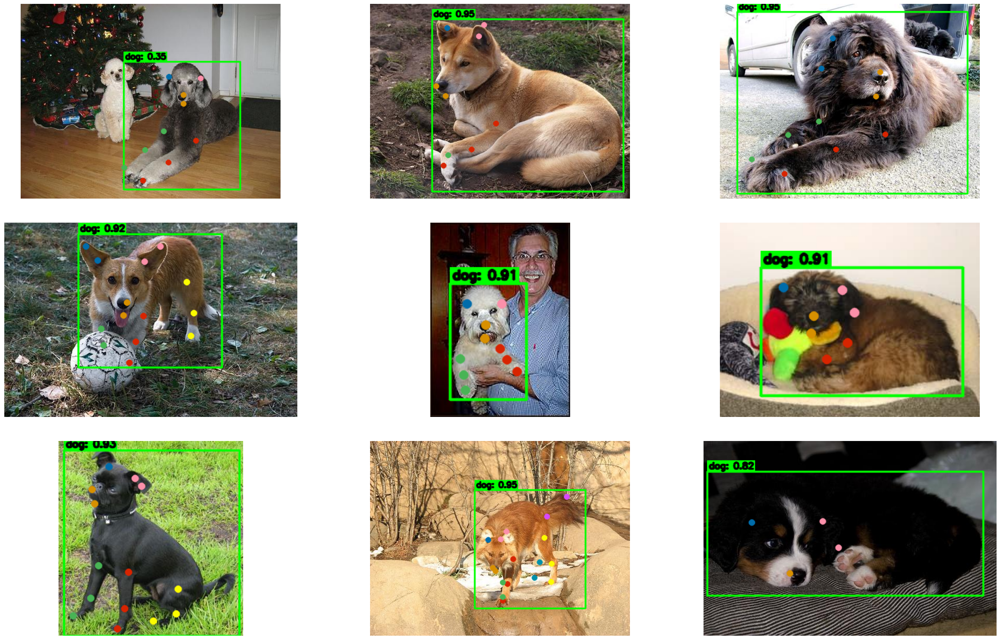

In [34]:
VAL_IMAGE_FILES = os.listdir(VALID_IMG_PATH)

num_samples = 9
num_rows = 3
num_cols = num_samples//num_rows

fig, ax = plt.subplots(
        nrows=num_rows,
        ncols=num_cols,
        figsize=(25, 15),
    )

random.seed(90)
random.shuffle(VAL_IMAGE_FILES)

for idx, (file, axis) in enumerate(zip(VAL_IMAGE_FILES[:num_samples], ax.flat)):

    image_pred = prepare_predictions(VALID_IMG_PATH, file, model_pose)
    axis.imshow(image_pred[...,::-1])
    axis.axis("off")

plt.tight_layout(h_pad=4., w_pad=4.)
plt.show();